In [2]:
import os
import random
from glob import glob

import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from tqdm import tqdm

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
import torchvision.transforms as transforms

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'Using device: {device}')

torch.manual_seed(42)
np.random.seed(42)
random.seed(42)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(42)

Using device: cuda


In [7]:
class SegmentationDataset(Dataset):

    # Arguments:
    #   - image_path: folder with images
    #   - mask_path: folder with masks
    # Returns:
    #   - image: Tensor (3,H,W) float
    #   - mask: Tensor (H,W) long (label map)
    #   - mask_onehot: Tensor (C,H,W) float (only used internally if needed)

    def __init__(self, image_path, mask_path, transform=None, mask_transform=None, subset_size=None):
        self.image_paths = sorted(glob(os.path.join(image_path, "*")))
        self.mask_paths = sorted(glob(os.path.join(mask_path, "*")))
        if subset_size is not None:
            self.image_paths = self.image_paths[:subset_size]
            self.mask_paths = self.mask_paths[:subset_size]
        self.transform = transform
        self.mask_transform = mask_transform

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_p = self.image_paths[idx]
        mask_p = self.mask_paths[idx]

        image = Image.open(img_p).convert('L')
        mask = Image.open(mask_p).convert('L')

        if self.transform is not None:
            image = self.transform(image)  # Tensor CxHxW

        if self.mask_transform is not None:
            mask = self.mask_transform(mask)
        else:
            # Resize to 256 by 256 to make sure no size mismatch
            mask = transforms.Resize((256, 256), interpolation=transforms.InterpolationMode.NEAREST)(mask)

        mask_np = np.array(mask, dtype=np.int64)

        # Map mask labels 0, 85, 170, and 255 to 0..3:
        mapping = {0: 0, 85: 1, 170: 2, 255: 3}
        mask_np = np.vectorize(mapping.get)(mask_np)

        # ensure labels in 0..3
        assert mask_np.min() >= 0 and mask_np.max() <= 3, f"Mask labels out of expected range 0..3: {np.unique(mask_np)}"

        mask_tensor = torch.from_numpy(mask_np).long()  # H x W (long for metrics / argmax)
        return image, mask_tensor

In [8]:
transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor()
])

mask_transform = transforms.Compose([
    transforms.Resize((256, 256), interpolation=transforms.InterpolationMode.NEAREST)
])

In [9]:
train_image_dir = "/content/drive/My Drive/Colab Notebooks/comp3710/home/groups/comp3710/OASIS/keras_png_slices_train/"
train_mask_dir  = "/content/drive/My Drive/Colab Notebooks/comp3710/home/groups/comp3710/OASIS/keras_png_slices_seg_train/"
test_image_dir  = "/content/drive/My Drive/Colab Notebooks/comp3710/home/groups/comp3710/OASIS/keras_png_slices_test/"
test_mask_dir   = "/content/drive/My Drive/Colab Notebooks/comp3710/home/groups/comp3710/OASIS/keras_png_slices_seg_test/"

print('Loading datasets (color RGB, resized to 256x256)...')
train_dataset = SegmentationDataset(train_image_dir, train_mask_dir, transform=transform, mask_transform=mask_transform)
test_dataset  = SegmentationDataset(test_image_dir, test_mask_dir, transform=transform, mask_transform=mask_transform)

print(f'Training samples: {len(train_dataset)}')
print(f'Testing samples:  {len(test_dataset)}')

train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True, num_workers=6, pin_memory=True)
test_loader  = DataLoader(test_dataset, batch_size=64, shuffle=False, num_workers=6, pin_memory=True)

Loading datasets (color RGB, resized to 256x256)...
Training samples: 9664
Testing samples:  544


In [16]:
class ContextModule(nn.Module):
    def __init__(self, in_ch, out_ch, p_drop=0.3):
        super().__init__()
        self.in_ch, self.out_ch = in_ch, out_ch
        self.res_conv = nn.Conv2d(in_ch, out_ch, 1) if in_ch != out_ch else nn.Identity()

        self.block = nn.Sequential(
            nn.InstanceNorm2d(in_ch),
            nn.LeakyReLU(0.01, inplace=True),
            nn.Conv2d(in_ch, out_ch, kernel_size=3, padding=1),
            nn.Dropout2d(p_drop),
            nn.InstanceNorm2d(out_ch),
            nn.LeakyReLU(0.01, inplace=True),
            nn.Conv2d(out_ch, out_ch, kernel_size=3, padding=1),
        )

    def forward(self, x):
        return self.block(x) + self.res_conv(x)

class LocalizationModule(nn.Module):
    def __init__(self, in_ch, out_ch):
        super().__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_ch, out_ch, 3, padding=1),
            nn.InstanceNorm2d(out_ch),
            nn.LeakyReLU(0.01, inplace=True),
            nn.Conv2d(out_ch, out_ch // 2, 1),
            nn.InstanceNorm2d(out_ch // 2),
            nn.LeakyReLU(0.01, inplace=True),
        )

    def forward(self, x):
        return self.conv(x)

def upsample_block(in_ch, out_ch):
    return nn.Sequential(
        nn.Upsample(scale_factor=2, mode='nearest'),
        nn.Conv2d(in_ch, out_ch, 3, padding=1)
    )

class SimpleUNet(nn.Module):
    def __init__(self, in_channels=1, out_channels=4, dropout_p=0.2):
        super().__init__()

        # Encoder structure
        '''
        self.enc1 = self._conv_block(in_channels, 32, dropout_p)
        self.enc2 = self._conv_block(32, 64, dropout_p)
        self.enc3 = self._conv_block(64, 128, dropout_p)
        self.enc4 = self._conv_block(128, 256, dropout_p)
        '''
        self.enc1 = ContextModule(in_channels, 32, dropout_p)
        self.down1 = nn.Conv2d(32, 64, 3, stride=2, padding=1)
        self.enc2 = ContextModule(64, 64, dropout_p)
        self.down2 = nn.Conv2d(64, 128, 3, stride=2, padding=1)
        self.enc3 = ContextModule(128, 128, dropout_p)
        self.down3 = nn.Conv2d(128, 256, 3, stride=2, padding=1)
        self.enc4 = ContextModule(256, 256, dropout_p)

        '''
        # Pooling and upsampling
        self.pool = nn.MaxPool2d(2)
        self.upsample = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
        '''

        # Decorder structure
        '''
        self.dec4 = self._conv_block(256 + 128, 128, dropout_p)
        self.dec3 = self._conv_block(128 + 64, 64, dropout_p)
        self.dec2 = self._conv_block(64 + 32, 32, dropout_p)
        '''
        self.up3 = upsample_block(256, 128)
        self.dec3 = LocalizationModule(128 + 128, 128)
        self.up2 = upsample_block(64, 64)
        self.dec2 = LocalizationModule(64 + 64, 64)
        self.up1 = upsample_block(32, 32)
        self.dec1 = LocalizationModule(32 + 32, 32)

        '''
        self.final_conv = nn.Conv2d(32, out_channels, kernel_size=1)
        '''

        # Supervision
        self.seg1 = nn.Conv2d(32, out_channels, 1)
        self.seg2 = nn.Conv2d(64, out_channels, 1)

    def _conv_block(self, in_ch, out_ch, dropout_p=0.2):
        # Simple block of two convolutional layers, with batch normalisation and batch dropout between
        # Activation function is Leaky ReLU
        return nn.Sequential(
            nn.Conv2d(in_ch, out_ch, 3, padding=1),
            nn.BatchNorm2d(out_ch),
            nn.LeakyReLU(negative_slope=0.2, inplace=True),
            nn.Dropout2d(dropout_p),
            nn.Conv2d(out_ch, out_ch, 3, padding=1),
            nn.BatchNorm2d(out_ch),
            nn.LeakyReLU(negative_slope=0.2, inplace=True),
            nn.Dropout2d(dropout_p),
        )

    def forward(self, x):
        '''
        # Encoder forward propogation
        e1 = self.enc1(x) # 32
        e2 = self.enc2(self.pool(e1)) # 64
        e3 = self.enc3(self.pool(e2)) # 128
        e4 = self.enc4(self.pool(e3)) # 256 (latent/bottleneck)

        # Decoder forward propogation with skip connections from mirrored encoder blocks
        d4 = self.dec4(torch.cat([self.upsample(e4), e3], dim=1))
        d3 = self.dec3(torch.cat([self.upsample(d4), e2], dim=1))
        d2 = self.dec2(torch.cat([self.upsample(d3), e1], dim=1))

        out = self.final_conv(d2) # logits (B x C x H x W)
        # Apply softmax externally when needed (for probabilities)
        '''
        # Encoder forward propogation
        e1 = self.enc1(x)
        e2 = self.enc2(self.down1(e1))
        e3 = self.enc3(self.down2(e2))
        e4 = self.enc4(self.down3(e3))

        # Decoder forward propogation with skip connections from mirrored encoder blocks
        d3 = self.dec3(torch.cat([self.up3(e4), e3], dim=1))
        d2 = self.dec2(torch.cat([self.up2(d3), e2], dim=1))
        d1 = self.dec1(torch.cat([self.up1(d2), e1], dim=1))

        seg1 = self.seg1(d1)
        seg2 = torch.nn.functional.interpolate(self.seg2(d2), size=seg1.shape[2:], mode='bilinear', align_corners=False)
        out = seg1 + seg2

        return out

In [17]:
class MulticlassDiceLoss(nn.Module):
    def __init__(self, num_classes=4, smooth=1e-6):
        super(MulticlassDiceLoss, self).__init__()
        self.num_classes = num_classes
        self.smooth = smooth

    def forward(self, logits, targets):
        # Get predictions and use softmax to get normalised probabilities
        probs = torch.softmax(logits, dim=1)  # (B,C,H,W)
        # One-hot encode target mask
        targets_onehot = torch.nn.functional.one_hot(targets, num_classes=self.num_classes)  # (B,H,W,C)
        # Rearrange tensor such that one-hot encoding is in channel position
        targets_onehot = targets_onehot.permute(0, 3, 1, 2).float()  # (B,C,H,W)

        dice_per_class = []
        for c in range(self.num_classes):
            # Get probabilities and target mask per class
            p = probs[:, c, :, :]   # (B,H,W)
            t = targets_onehot[:, c, :, :]  # (B,H,W)

            # Calculate dice coefficient per class
            intersection = (p * t).sum(dim=(0,1,2))
            union = p.sum(dim=(0,1,2)) + t.sum(dim=(0,1,2))
            dice = (2.0 * intersection + self.smooth) / (union + self.smooth)
            dice_per_class.append(dice)

        return 1.0 - torch.stack(dice_per_class).mean()


In [12]:
def compute_dice_per_class(preds, targets, num_classes=4, smooth=1e-6):

    # Additional function for determining dice losses for every class, because idgaf
    # preds: BxHxW integer labels for each pixel indiciating which class the model predicts it belongs to
    # targets: BxHxW integer labels for each pixel indicating which class it actually belongs to (ground truth)
    # returns: array of dice coefficient scores per class

    dice_scores = []
    preds = preds.cpu().numpy()
    targets = targets.cpu().numpy()
    for c in range(num_classes):
        p_c = (preds == c).astype(np.uint8)
        t_c = (targets == c).astype(np.uint8)
        intersection = (p_c & t_c).sum()
        union = p_c.sum() + t_c.sum()
        if union == 0:
            # If both prediction and target have zero pixels for this class in this batch, define dice as 1 (perfect) to avoid penalizing absence.
            dice = 1.0
        else:
            dice = (2.0 * intersection + smooth) / (union + smooth)
        dice_scores.append(dice)
    return np.array(dice_scores)

In [13]:
def visualize_batch_images_and_masks(loader, num_batches=1, class_colors=None):
    # Show first batch
    batch_iter = iter(loader)
    images, masks = next(batch_iter)
    images = images.cpu()
    masks = masks.cpu().numpy()
    bs = images.shape[0]
    if class_colors is None:
        # Assign colors for all four classes of brsain classes
        class_colors = np.array([[0,0,0],[255,0,0],[0,255,0],[0,0,255]], dtype=np.uint8)

    fig, axs = plt.subplots(bs, 2, figsize=(8, 4*bs))
    for i in range(bs):
        img = images[i]
        # denormalise if normalised earlier
        img_np = img.numpy().transpose(1,2,0)
        # img_np = (img_np * 0.5) + 0.5
        img_np = np.clip(img_np, 0, 1)

        axs[i, 0].imshow(img_np)
        axs[i, 0].axis('off')
        axs[i, 0].set_title('Image')

        mask = masks[i]
        # create color map
        # get empty tensor the size of the image mask with three channels (RGB)
        colored = np.zeros((mask.shape[0], mask.shape[1], 3), dtype=np.uint8)
        for c in range(class_colors.shape[0]): # set RGB values per pixel in empty tensor based on class value
            colored[mask == c] = class_colors[c]
        axs[i, 1].imshow(colored)
        axs[i, 1].axis('off')
        axs[i, 1].set_title('GT Mask')
    plt.tight_layout()
    plt.show()

def visualize_prediction(image_tensor, gt_mask, pred_mask, class_colors=None):

    # single sample visualizer
    # image_tensor: (3,H,W) tensor
    # gt_mask, pred_mask: numpy HxW labels

    if class_colors is None:
        class_colors = np.array([[0,0,0],[255,0,0],[0,255,0],[0,0,255]], dtype=np.uint8)

    img_np = image_tensor.cpu().numpy().transpose(1,2,0)
    # img_np = (img_np * 0.5) + 0.5
    img_np = np.clip(img_np, 0, 1)

    gt_col = np.zeros((gt_mask.shape[0], gt_mask.shape[1], 3), dtype=np.uint8)
    pred_col = np.zeros_like(gt_col)
    for c in range(class_colors.shape[0]):
        gt_col[gt_mask == c] = class_colors[c]
        pred_col[pred_mask == c] = class_colors[c]

    fig, axs = plt.subplots(1,3,figsize=(12,4))
    axs[0].imshow(img_np); axs[0].axis('off'); axs[0].set_title('Image')
    axs[1].imshow(gt_col); axs[1].axis('off'); axs[1].set_title('GT Mask')
    axs[2].imshow(pred_col); axs[2].axis('off'); axs[2].set_title('Pred Mask')
    plt.show()

In [14]:
def train(model, train_loader, val_loader=None, epochs=20, lr=1e-3, visualize_every=5):
    model.to(device)
    criterion = MulticlassDiceLoss(num_classes=4)
    optimizer = optim.Adam(model.parameters(), lr=lr)
    losses = []
    for epoch in range(epochs):
        model.train()
        epoch_loss = 0.0
        for images, masks in tqdm(train_loader, desc=f"Epoch {epoch+1}/{epochs} - training"):
            images = images.to(device)
            masks = masks.to(device)

            optimizer.zero_grad()
            logits = model(images)  # B x C x H x W
            loss = criterion(logits, masks)
            loss.backward()
            optimizer.step()

            epoch_loss += loss.item()
        avg_loss = epoch_loss / len(train_loader)
        losses.append(avg_loss)
        print(f"Epoch {epoch+1}/{epochs} - Loss: {avg_loss:.4f}")

        if (epoch + 1) % visualize_every == 0 and val_loader is not None:
            # visualise predictions for epoch's training
            model.eval()
            with torch.no_grad():
                val_images, val_masks = next(iter(val_loader))
                val_images = val_images.to(device)
                logits = model(val_images)
                probs = torch.softmax(logits, dim=1)
                preds = torch.argmax(probs, dim=1).cpu().numpy()
                for i in range(min(3, val_images.size(0))):
                    visualize_prediction(val_images[i].cpu(), val_masks[i].numpy(), preds[i])
            model.train()

    print("Training complete.")
    return losses

def evaluate_and_visualize(model, test_loader, num_classes=4):
    model.to(device)
    model.eval()
    all_dice = []
    per_class_sum = np.zeros((num_classes,), dtype=float)
    n_samples = 0
    with torch.no_grad():
        for images, masks in tqdm(test_loader, desc="Evaluating"):
            images = images.to(device)
            masks = masks.to(device)
            logits = model(images)
            probs = torch.softmax(logits, dim=1)
            preds = torch.argmax(probs, dim=1)  # B x H x W

            # compute dice per class for this batch
            dice_batch = compute_dice_per_class(preds, masks, num_classes=num_classes)
            per_class_sum += dice_batch
            n_samples += 1

        per_class_mean = per_class_sum / max(1, n_samples)
        for c, d in enumerate(per_class_mean):
            print(f"Class {c} Dice: {d:.4f}")
    # Visualize a few examples
    # Take first batch for visualization
    val_iter = iter(test_loader)
    images, masks = next(val_iter)
    images = images.to(device)
    logits = model(images)
    probs = torch.softmax(logits, dim=1)
    preds = torch.argmax(probs, dim=1).cpu().numpy()
    masks = masks.numpy()
    for i in range(min(4, images.size(0))):
        visualize_prediction(images[i].cpu(), masks[i], preds[i])

    return per_class_mean

SimpleUNet(
  (enc1): Sequential(
    (0): Conv2d(1, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2, inplace=True)
    (3): Dropout2d(p=0.2, inplace=False)
    (4): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): LeakyReLU(negative_slope=0.2, inplace=True)
    (7): Dropout2d(p=0.2, inplace=False)
  )
  (enc2): Sequential(
    (0): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2, inplace=True)
    (3): Dropout2d(p=0.2, inplace=False)
    (4): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
   

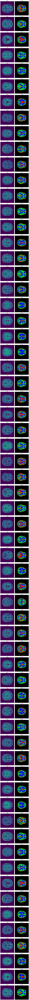

Epoch 1/15 - training:  16%|█▌        | 24/151 [03:42<19:38,  9.28s/it]


KeyboardInterrupt: 

In [15]:
model = SimpleUNet(in_channels=1, out_channels=4, dropout_p=0.2)
print(model)

# Visualize sample images + GT masks from train loader
visualize_batch_images_and_masks(train_loader, num_batches=1)

# Train
losses = train(model, train_loader, val_loader=test_loader, epochs=15, lr=1e-3, visualize_every=1)

In [ ]:
# Evaluate on test set and visualize predictions
per_class_mean = evaluate_and_visualize(model, test_loader, num_classes=4)